# Analyze the XAI Evaluation Results

# Imports

## Import Libraries

In [352]:
#Data wrangling
from imp import reload
import numpy as np
import pandas as pd

#Data Visualization
import matplotlib.pyplot as plt
import seaborn as sns



#Data Analysis
import statsmodels.api as sm
from statsmodels.formula.api import ols
import scipy.stats

## Import evaluation results

In [511]:
df = pd.read_csv('/Users/eddie/Library/CloudStorage/OneDrive-UniversityofPittsburgh/Research/Projects/Explainability Method Comparison/Data-ML-XAI-Eval/Results/XAI Evaluation Data/CleanEvals.csv')
df = df.loc[df.Samples.isin([100, 300, 500, 700, 900, 1000])]
df['Combination'] = np.abs(df.kendall-df.score)
df.score = df.score*100
df.score_bottom = df.score_bottom*100
df.score_top = df.score_top*100
df.AB = df.AB.str.replace('A', 'Fully Confounded').replace('B', 'Partially Confounded')


In [512]:
df

,Explainer,Model,Dataset,AB,score,score_bottom,score_top,kendall,random,noise,Skew,Samples,HC,ConfVars,Combination
0,ShapExact,FauxModel,0_vars_corr_0HC_n100.csv,Fully Confounded,12.922301,10.772059,15.072544,0.333333,0.798355,0.000000,0.5,100.0,0.0,0.0,0.204110
1,ShapExact,FauxModel,0_vars_corr_0HC_n1000.csv,Fully Confounded,4.547727,6.249262,2.846193,0.666667,0.766290,0.000000,0.5,1000.0,0.0,0.0,0.621189
3,ShapExact,FauxModel,0_vars_corr_0HC_n300.csv,Fully Confounded,6.851334,7.820885,5.881782,0.333333,0.779423,0.000000,0.5,300.0,0.0,0.0,0.264820
5,ShapExact,FauxModel,0_vars_corr_0HC_n500.csv,Fully Confounded,8.698595,6.508777,10.888413,0.000000,0.821035,0.000000,0.5,500.0,0.0,0.0,0.086986
7,ShapExact,FauxModel,0_vars_corr_0HC_n700.csv,Fully Confounded,6.222169,6.324926,6.119413,0.000000,0.806619,0.000000,0.5,700.0,0.0,0.0,0.062222
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1053,ShapTree,XGBoost,3_vars_corr_2HC_n500B.csv,Partially Confounded,10.297015,10.690601,9.903429,0.333333,0.851517,0.014364,0.5,500.0,2.0,3.0,0.230363
1054,ShapTree,XGBoost,3_vars_corr_2HC_n700.csv,Fully Confounded,-0.630455,-0.348671,-0.912238,0.333333,0.935193,0.000000,0.5,700.0,2.0,3.0,0.339638
1055,ShapTree,XGBoost,3_vars_corr_2HC_n700B.csv,Partially Confounded,7.571939,8.876052,6.267826,0.333333,0.844860,0.035008,0.5,700.0,2.0,3.0,0.257614
1056,ShapTree,XGBoost,3_vars_corr_2HC_n900.csv,Fully Confounded,-0.850254,-0.733224,-0.967285,0.666667,0.934339,0.000000,0.5,900.0,2.0,3.0,0.675169


# Answering Questions of Interest

## Does sample size affect explainer performance?

### Select datasets of interest, those where we only vary the sample size

In [483]:
# We choose only the datasets with 0 confounding variables and not modified by the skewness
df_sample_size = df

### Pearson correlations between: (1) sample size and road score and (2) sample size and kendall's tau. 
(1) Answers how sample size affects the ability of the explainer to accurately explain the predictive model. <br>
(2) Answers how sample size affects  the ability of the explaienr to accurately recover the causal relationships in the data.

In [484]:
df.kendall.unique()

array([0.33333333, 0.66666667, 0.        , 1.        , 0.16666667,
       0.5       , 0.18257419, 0.83333333])

In [485]:
sample_vs_road = scipy.stats.pearsonr(df.Samples, df.score)
sample_vs_data = scipy.stats.pearsonr(df.Samples, df.kendall)

#Report the results
print(f'ROAD vs Sample Size: CorrCoeff = {sample_vs_road[0]}, p-value = {sample_vs_road[1]}')
print(f'Kendall vs Sample Size: CorrCoeff = {sample_vs_data[0]}, p-value = {sample_vs_data[1]}')

ROAD vs Sample Size: CorrCoeff = -0.20928246211465526, p-value = 5.06313784407897e-11
Kendall vs Sample Size: CorrCoeff = 0.08216148122435735, p-value = 0.010629856824828745


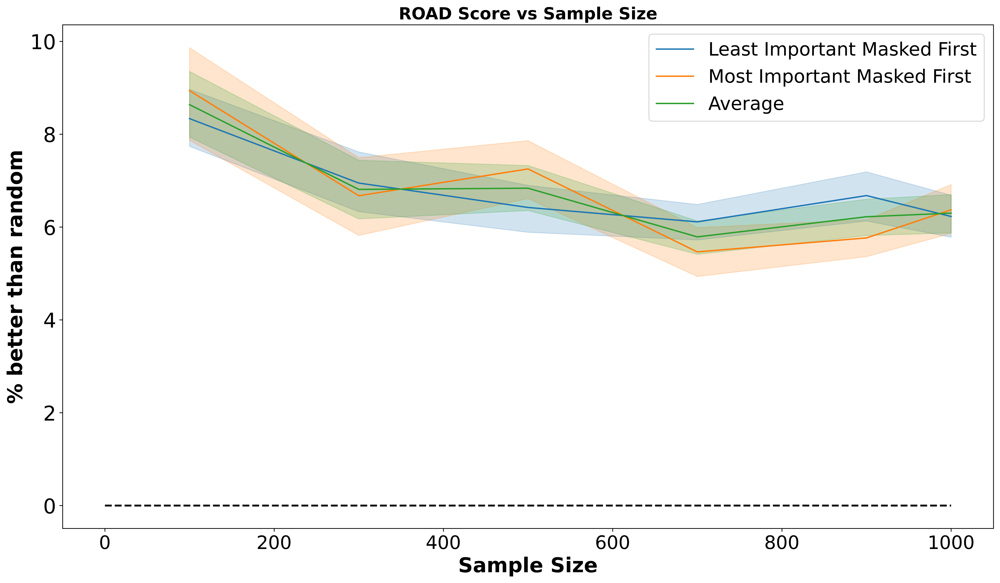

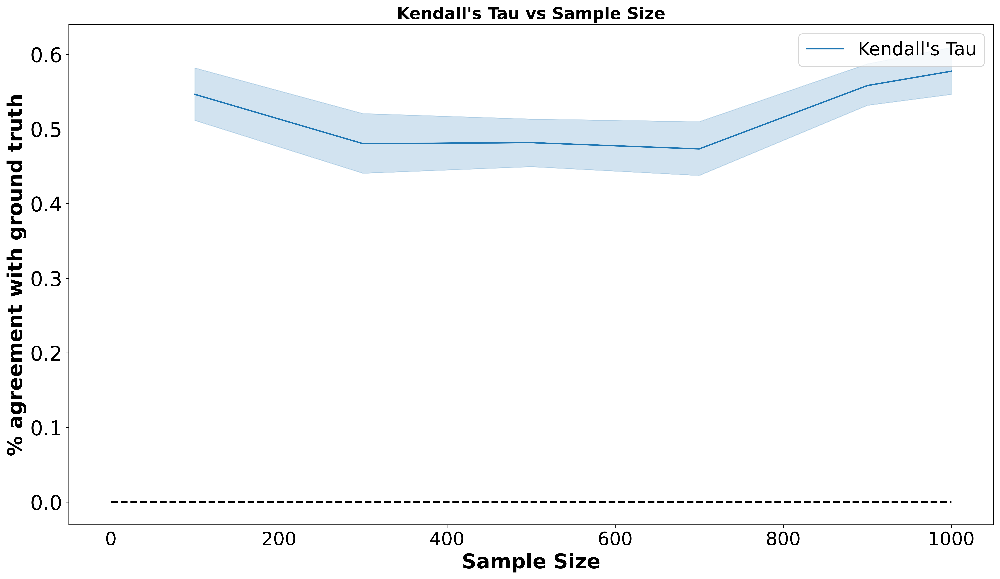

In [476]:
plt.figure(figsize=(18,10), dpi=600)
sns.lineplot(x = 'Samples', y = 'score_bottom', data= df_sample_size.reset_index(), palette="colorblind", label = 'Least Important Masked First')
sns.lineplot(x = 'Samples', y = 'score_top', data= df_sample_size.reset_index(), palette="colorblind", label = 'Most Important Masked First')
sns.lineplot(x = 'Samples', y = 'score', data= df_sample_size.reset_index(), palette="colorblind", label = 'Average')
plt.hlines(0, 0, 1000, linewidth = 2, color = 'black', ls = '--')
plt.title('ROAD Score vs Sample Size',  fontdict = {'fontsize' : 18, 'fontweight': 'bold'})
plt.yticks(fontsize = 22)
plt.xticks(fontsize = 20) 
plt.ylabel('% better than random', fontsize = 22, fontweight = 'bold')
plt.xlabel('Sample Size', fontsize = 22, fontweight = 'bold')
plt.legend(fontsize = 20, loc = 'upper right')
plt.show()

plt.figure(figsize=(18,10), dpi=600)
sns.lineplot(x = 'Samples', y = 'kendall', data= df_sample_size.reset_index(), palette="colorblind", label = 'Kendall\'s Tau')
plt.hlines(0, 0, 1000, linewidth = 2, color = 'black', ls = '--')
plt.title("Kendall's Tau vs Sample Size",  fontdict = {'fontsize' : 18, 'fontweight': 'bold'})
plt.yticks(fontsize = 22)
plt.xticks(fontsize = 20) 
plt.ylabel('% agreement with ground truth', fontsize = 22, fontweight = 'bold')
plt.xlabel('Sample Size', fontsize = 22, fontweight = 'bold')
plt.legend(fontsize = 20, loc = 'upper right')
plt.show()

### Study possible interactions that may be confounding the pearson correlation using an ANOVA

#### ROAD Score vs Sample Size : Interactions with Model and Explainer

In [358]:
#ANOVA
model = ols('score ~ Samples + C(Model) + C(Explainer)', data=df_sample_size).fit()
print('Type 2 ANOVA Test: formula = score ~ Samples + C(Model) + C(Explainer)')
print(sm.stats.anova_lm(model, typ=2))
print('\n')
model = ols('score ~  Samples*C(Model)*C(Explainer)*Repeat', data=df_sample_size).fit()
print('Type 2 ANOVA Test: formula = score ~  Samples:C(Model)+ Samples:C(Explainer) + C(Model):C(Explainer)')
print(sm.stats.anova_lm(model, typ=3))

Type 2 ANOVA Test: formula = score ~ Samples + C(Model) + C(Explainer)
                     sum_sq      df           F        PR(>F)
C(Model)         367.089014     3.0   10.390625  8.007418e-07
C(Explainer)     924.567754     6.0   13.085159  8.368774e-15
Samples         5213.580007     1.0  442.718395  3.915447e-96
Residual      113629.417813  9649.0         NaN           NaN


Type 2 ANOVA Test: formula = score ~  Samples:C(Model)+ Samples:C(Explainer) + C(Model):C(Explainer)
                                             sum_sq      df           F  \
Intercept                               1758.992412     1.0  149.560407   
C(Model)                                  25.740919     3.0    0.729551   
C(Explainer)                              40.718002     6.0    0.577016   
C(Model):C(Explainer)                     98.237411    18.0    0.464042   
Samples                                   50.108646     1.0    4.260547   
Samples:C(Model)                          17.145366     3.0    0.4

/Users/eddie/miniconda3/envs/python_env/lib/python3.8/site-packages/statsmodels/base/model.py:1871: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 18, but rank is 15
  warnings.warn('covariance of constraints does not have full '
/Users/eddie/miniconda3/envs/python_env/lib/python3.8/site-packages/statsmodels/base/model.py:1871: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 18, but rank is 15
  warnings.warn('covariance of constraints does not have full '
/Users/eddie/miniconda3/envs/python_env/lib/python3.8/site-packages/statsmodels/base/model.py:1871: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 18, but rank is 15
  warnings.warn('covariance of constraints does not have full '
/Users/eddie/miniconda3/envs/python_env/lib/python3.8/site-packages/statsmodels/base/model.py:1871: ValueWarning: covariance of constraints does not have full rank. The 

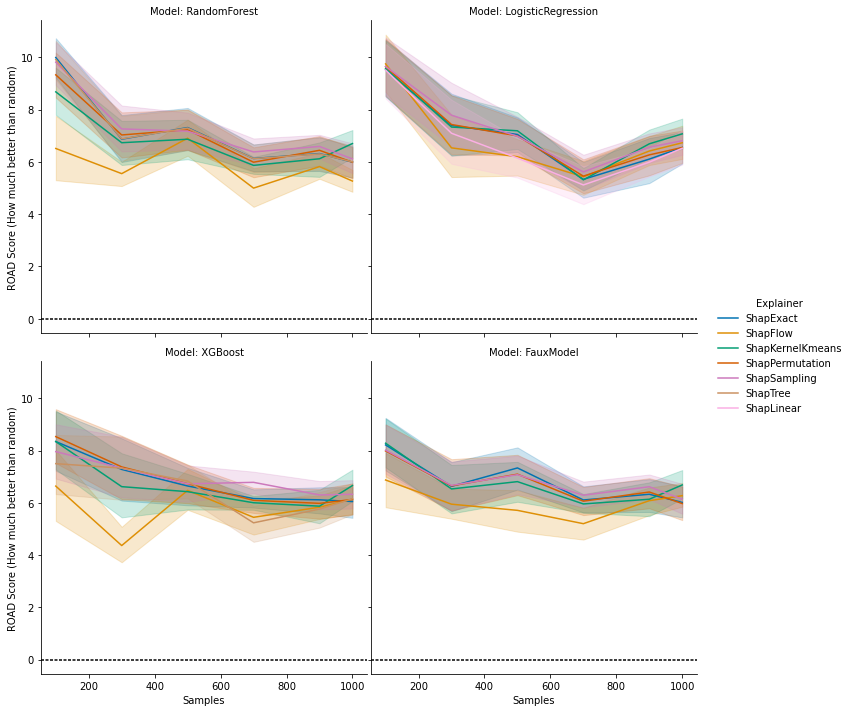

In [359]:
g = sns.relplot(x = 'Samples', y = 'score', hue='Explainer', col = 'Model', col_wrap= 2, data= df, palette="colorblind", kind = 'line')
(g.map(plt.axhline, y=0, color ='black', dashes = (2,1))
  .set_axis_labels("Samples", "ROAD Score (How much better than random)")
  .set_titles("Model: {col_name}")
  .tight_layout(w_pad=0)
)

#### Kendall's Tau vs Sample Size : Interactions with Model and Explainer

In [360]:
#ANOVA
model = ols('kendall ~ Samples + C(Model) + C(Explainer)', data=df_sample_size).fit()
print('Type 2 ANOVA Test: formula = kendall ~ Samples + C(Model) + C(Explainer)')
print(sm.stats.anova_lm(model, typ=2))
print('\n')
model = ols('kendall ~  Samples:C(Model)+ Samples:C(Explainer) + C(Model):C(Explainer)', data=df_sample_size).fit()
print('Type 2 ANOVA Test: formula = kendall ~  Samples:C(Model)+ Samples:C(Explainer) + C(Model):C(Explainer)')
print(sm.stats.anova_lm(model, typ=3))

Type 2 ANOVA Test: formula = kendall ~ Samples + C(Model) + C(Explainer)
                  sum_sq      df          F        PR(>F)
C(Model)        0.328156     3.0   2.165285  8.989914e-02
C(Explainer)    9.852272     6.0  32.504336  5.518624e-39
Samples         2.754552     1.0  54.526436  1.660678e-13
Residual      487.445594  9649.0        NaN           NaN


Type 2 ANOVA Test: formula = kendall ~  Samples:C(Model)+ Samples:C(Explainer) + C(Model):C(Explainer)
                           sum_sq      df           F         PR(>F)
Intercept               43.676855     1.0  871.026858  2.411025e-183
C(Model):C(Explainer)    8.162469    27.0    6.028898   1.166383e-17
Samples:C(Model)         1.521682     4.0    7.586545   4.248986e-06
Samples:C(Explainer)     1.687465     6.0    5.608719   8.033672e-06
Residual               482.737221  9627.0         NaN            NaN


/Users/eddie/miniconda3/envs/python_env/lib/python3.8/site-packages/statsmodels/base/model.py:1871: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 27, but rank is 22
  warnings.warn('covariance of constraints does not have full '


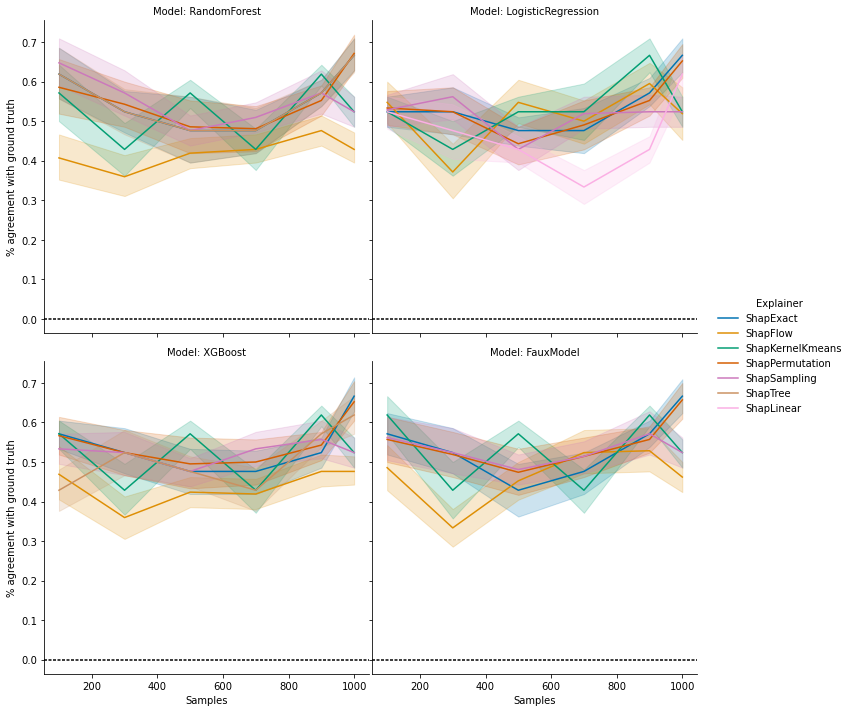

In [361]:
g = sns.relplot(x = 'Samples', y = 'kendall', hue='Explainer', col = 'Model', col_wrap= 2, data= df_sample_size, palette="colorblind", kind = 'line')
(g.map(plt.axhline, y=0, color ='black', dashes = (2,1))
  .set_axis_labels("Samples", "% agreement with ground truth")
  .set_titles("Model: {col_name}")
  .tight_layout(w_pad=0)
)

## Does Class Imbalance (Skew) affect explainer performance?

### Select datasets of interest, those where we only vary class imbalance (skew)?

In [25]:
df_skew = df

### Pearson correlations between: (1) skew and road score and (2) skew and kendall's tau.

In [26]:
#Pearson Correlation
skew_vs_road = scipy.stats.pearsonr(df_skew.Skew, df_skew.score)
skew_vs_data = scipy.stats.pearsonr(df_skew.Skew, df_skew.kendall)

#Report the results
print(f'ROAD vs Skew: CorrCoeff = {skew_vs_road[0]}, p-value = {skew_vs_road[1]}')
print(f'Kendall vs Skew: CorrCoeff = {skew_vs_data[0]}, p-value = {skew_vs_data[1]}')   

ROAD vs Skew: CorrCoeff = nan, p-value = nan
Kendall vs Skew: CorrCoeff = nan, p-value = nan


/Users/eddie/miniconda3/envs/python_env/lib/python3.8/site-packages/scipy/stats/stats.py:4023: PearsonRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(PearsonRConstantInputWarning())


### Study possible interactions that may be confounding the pearson correlation using an ANOVA

#### ROAD Score vs Skew: Interactions with Model and Explainer

In [27]:
# ANOVA
model = ols('score ~ Skew + C(Model) + C(Explainer)', data=df_skew).fit()
print('Type 2 ANOVA Test: formula = score ~ Skew + C(Model) + C(Explainer)')
print(sm.stats.anova_lm(model, typ=2))
print('\n')
model = ols('score ~  Skew:C(Model) + Skew:C(Explainer) + C(Model):C(Explainer)', data=df_skew).fit()
print('Type 2 ANOVA Test: formula = score ~  Skew:C(Model) + Skew:C(Explainer) + C(Model):C(Explainer)')
print(sm.stats.anova_lm(model, typ=2))


Type 2 ANOVA Test: formula = score ~ Skew + C(Model) + C(Explainer)
                     sum_sq      df          F        PR(>F)
C(Model)         401.980982     3.0  10.532812  6.515314e-07
C(Explainer)    1146.204497     6.0  15.016577  3.497459e-17
Skew              27.470958     1.0   2.159404  1.417322e-01
Residual      122750.200002  9649.0        NaN           NaN


Type 2 ANOVA Test: formula = score ~  Skew:C(Model) + Skew:C(Explainer) + C(Model):C(Explainer)
                              sum_sq      df         F    PR(>F)
C(Model):C(Explainer)    1091.601369    27.0  3.154325  0.000831
Skew:C(Model)             240.791644     4.0  4.696643  0.000872
Skew:C(Explainer)          87.599900     6.0  1.139091  0.336516
Residual               123481.094162  9634.0       NaN       NaN


/Users/eddie/miniconda3/envs/python_env/lib/python3.8/site-packages/statsmodels/base/model.py:1871: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 27, but rank is 9
  warnings.warn('covariance of constraints does not have full '


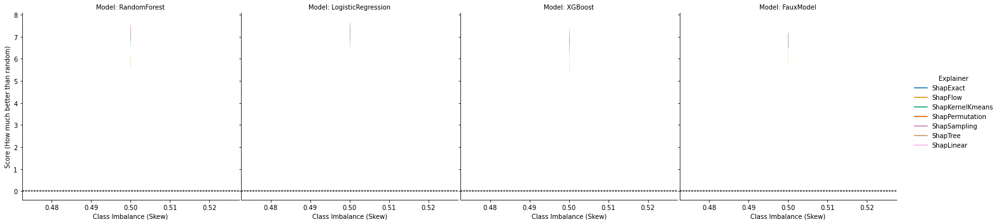

In [28]:
plot_df = df_skew
g = sns.relplot(x = 'Skew', y = 'score', hue='Explainer', col = 'Model', col_wrap= 4, data= plot_df, palette="colorblind", kind = 'line')

(g.map(plt.axhline, y=0, color ='black', dashes = (2,1))
  .set_axis_labels("Class Imbalance (Skew)", "Score (How much better than random)")
  .set_titles("Model: {col_name}")
  .tight_layout(w_pad=0)
)


#### Kendall's Tau vs Skew: Interactions with Model and Explainer

In [32]:
# ANOVA
model = ols('kendall ~ Skew + C(Model) + C(Explainer)', data=df_skew).fit()
print('Type 2 ANOVA Test: formula = kendall ~ Skew + C(Model) + C(Explainer)')
print(sm.stats.anova_lm(model, typ=2))
print('\n')
model = ols('kendall ~  Skew:C(Model) + Skew:C(Explainer) + C(Model):C(Explainer)', data=df_skew).fit()
print('Type 2 ANOVA Test: formula = kendall ~  Skew:C(Model) + Skew:C(Explainer) + C(Model):C(Explainer)')
print(sm.stats.anova_lm(model, typ=2))

Type 2 ANOVA Test: formula = kendall ~ Skew + C(Model) + C(Explainer)
                sum_sq     df         F    PR(>F)
C(Model)      0.015009    3.0  0.509155  0.676106
C(Explainer)  0.026675    5.0  0.542940  0.743768
Skew          0.092563    1.0  9.420122  0.002247
Residual      5.689287  579.0       NaN       NaN


Type 2 ANOVA Test: formula = kendall ~  Skew:C(Model) + Skew:C(Explainer) + C(Model):C(Explainer)
                         sum_sq     df         F    PR(>F)
C(Model):C(Explainer)  0.124937   23.0  0.544555  0.936526
Skew:C(Model)          0.098075    4.0  2.457987  0.044594
Skew:C(Explainer)      0.004160    5.0  0.083416  0.994818
Residual               5.596068  561.0       NaN       NaN


/Users/eddie/miniconda3/envs/python_env/lib/python3.8/site-packages/statsmodels/base/model.py:1871: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 23, but rank is 18
  warnings.warn('covariance of constraints does not have full '


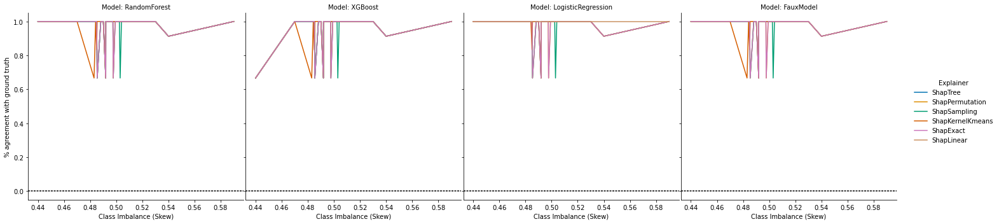

In [33]:

g = sns.relplot(x = 'Skew', y = 'kendall', hue='Explainer', col = 'Model', col_wrap= 4, data= plot_df, palette="colorblind", kind = 'line')

(g.map(plt.axhline, y=0, color ='black', dashes = (2,1))
  .set_axis_labels("Class Imbalance (Skew)", "% agreement with ground truth")
  .set_titles("Model: {col_name}")
  .tight_layout(w_pad=0)
)


## Do hidden confounders in the data affect explainer performance?

### Select only datasets where we varied confounding

In [362]:
df_hc = df

### Pearson Correlations between: (1) hc and road score, (2) confvars and road score, (3) hc and kendall's tau, (4) confvars and kendall's tau

In [30]:
np.any(np.logical_and(df.HC == 2, df.ConfVars == 3))

print(df.AB.unique())

['A' 'B']


In [31]:
df_pattern.AB

NameError: name 'df_pattern' is not defined

In [363]:
#Pearson Correlation
hc_vs_road = scipy.stats.pearsonr(df_hc.HC, df_hc.score)
hc_vs_data = scipy.stats.pearsonr(df_hc.HC, df_hc.kendall)

confvars_vs_road = scipy.stats.pearsonr(df_hc.ConfVars, df_hc.score)
confvars_vs_data = scipy.stats.pearsonr(df_hc.ConfVars, df_hc.kendall)


df_pattern = df.loc[df.HC == 2]
pattern_vs_road = scipy.stats.spearmanr(df_pattern.AB, df_pattern.score)
pattern_vs_data = scipy.stats.spearmanr(df_pattern.AB, df_pattern.kendall)


#Report the results
print(f'ROAD vs HC: CorrCoeff = {hc_vs_road[0]}, p-value = {hc_vs_road[1]}')
print(f'ROAD vs ConfVars: CorrCoeff = {confvars_vs_road[0]}, p-value = {confvars_vs_road[1]}')
print(f'Kendall vs HC: CorrCoeff = {hc_vs_data[0]}, p-value = {hc_vs_data[1]}')
print(f'Kendall vs ConfVars: CorrCoeff = {confvars_vs_data[0]}, p-value = {confvars_vs_data[1]}')
print(f'ROAD vs Pattern: CorrCoeff = {pattern_vs_road[0]}, p-value = {pattern_vs_road[1]}')
print(f'Kendall vs Pattern: CorrCoeff = {pattern_vs_data[0]}, p-value = {pattern_vs_data[1]}')

ROAD vs HC: CorrCoeff = -0.10325869339768551, p-value = 2.571784013229461e-24
ROAD vs ConfVars: CorrCoeff = -0.3151530678040702, p-value = 1.0670955508279973e-221
Kendall vs HC: CorrCoeff = 0.24193816003662694, p-value = 1.0653855565568176e-128
Kendall vs ConfVars: CorrCoeff = 0.06020209780902277, p-value = 3.188503193827276e-09
ROAD vs Pattern: CorrCoeff = 0.3269632518205807, p-value = 9.670170842893305e-104
Kendall vs Pattern: CorrCoeff = -0.727128356721049, p-value = 0.0


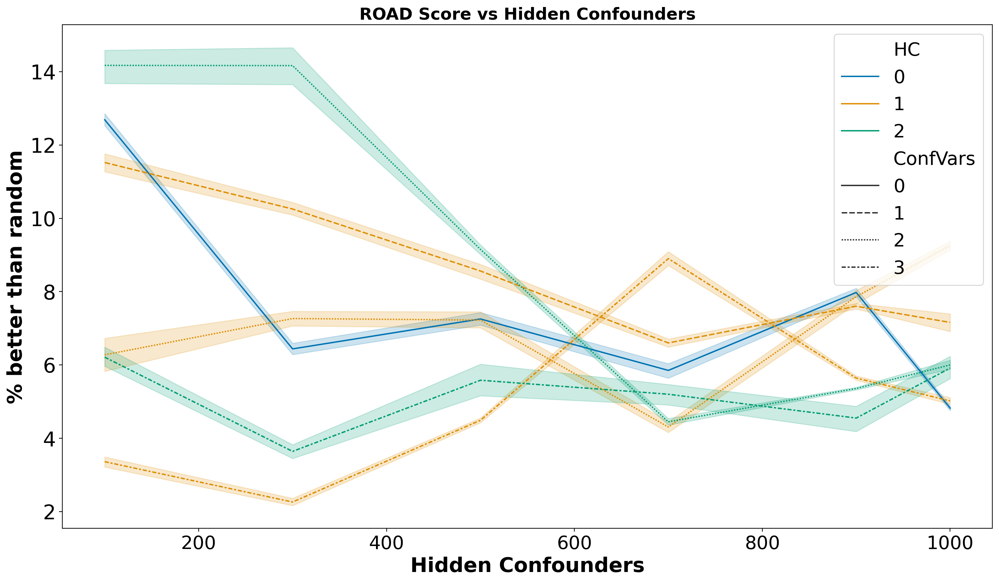

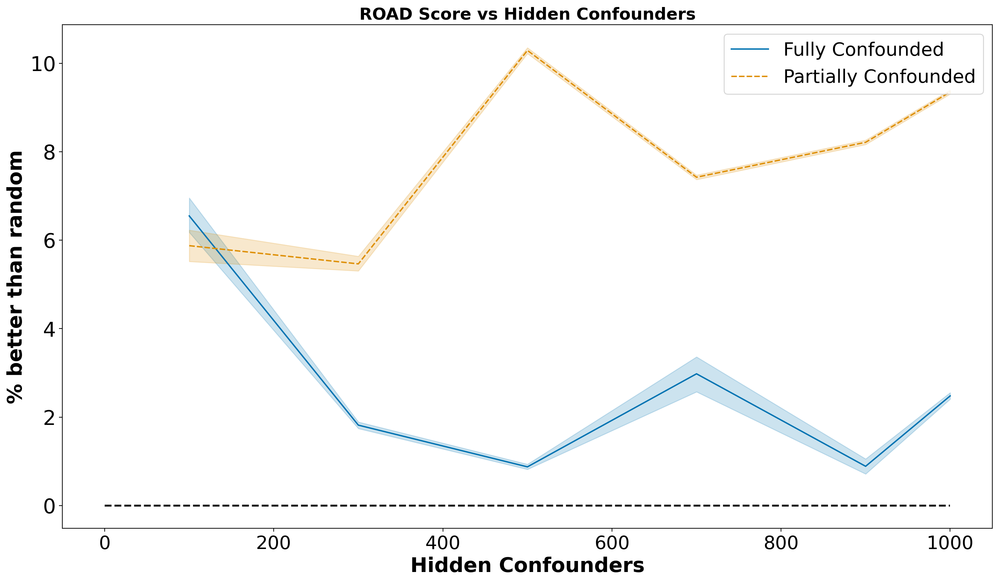

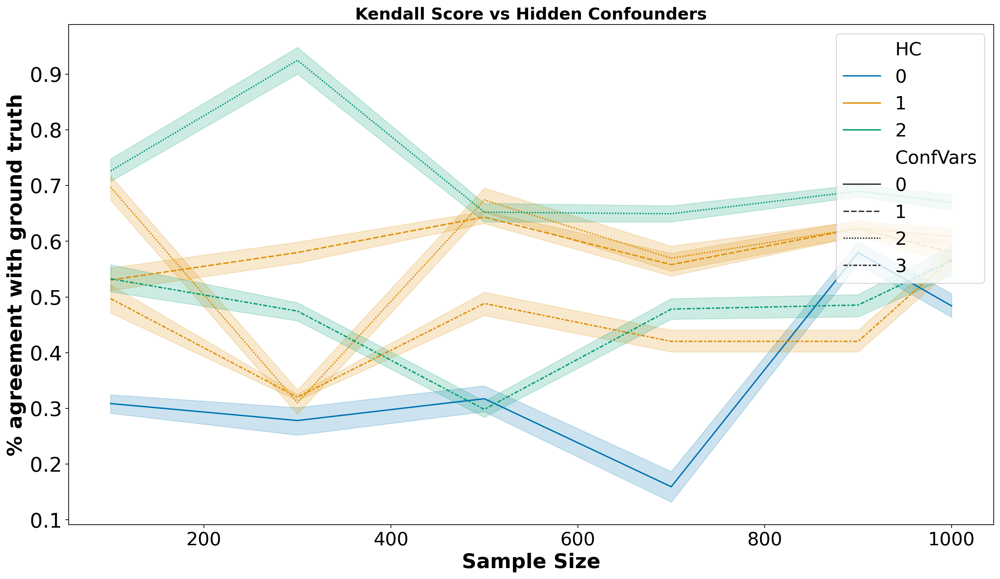

In [381]:
plt.figure(figsize=(18,10), dpi=200)
sns.lineplot(x = 'Samples', y = 'score', data= df, palette="colorblind", hue = 'HC', style= 'ConfVars')
# plt.hlines(0, 0, 2, linewidth = 2, color = 'black', ls = '--')
plt.title('ROAD Score vs Hidden Confounders',  fontdict = {'fontsize' : 18, 'fontweight': 'bold'})
plt.yticks(fontsize = 22)
plt.xticks(fontsize = 20) 
plt.ylabel('% better than random', fontsize = 22, fontweight = 'bold')
plt.xlabel('Hidden Confounders', fontsize = 22, fontweight = 'bold')
plt.legend(fontsize = 20, loc = 'upper right')
plt.show()

plt.figure(figsize=(18,10), dpi=200)
sns.lineplot(x = 'Samples', y = 'score', data= df.loc[np.logical_and(df.HC == 2, df.ConfVars == 3)], palette="colorblind", hue = 'AB', style= 'AB')
plt.hlines(0, 0, 1000, linewidth = 2, color = 'black', ls = '--')
plt.title('ROAD Score vs Hidden Confounders',  fontdict = {'fontsize' : 18, 'fontweight': 'bold'})
plt.yticks(fontsize = 22)
plt.xticks(fontsize = 20) 
plt.ylabel('% better than random', fontsize = 22, fontweight = 'bold')
plt.xlabel('Hidden Confounders', fontsize = 22, fontweight = 'bold')
plt.legend(fontsize = 20, loc = 'upper right')
plt.show()

plt.figure(figsize=(18,10), dpi=200)
sns.lineplot(x = 'Samples', y = 'kendall', data= df, palette="colorblind", hue = 'HC', style= 'ConfVars')
# plt.hlines(0, 0, 2, linewidth = 2, color = 'black', ls = '--')
plt.title('Kendall Score vs Hidden Confounders',  fontdict = {'fontsize' : 18, 'fontweight': 'bold'})
plt.yticks(fontsize = 22)
plt.xticks(fontsize = 20) 
plt.ylabel('% agreement with ground truth', fontsize = 22, fontweight = 'bold')
plt.xlabel('Sample Size', fontsize = 22, fontweight = 'bold')
plt.legend(fontsize = 20, loc = 'upper right')
plt.show()

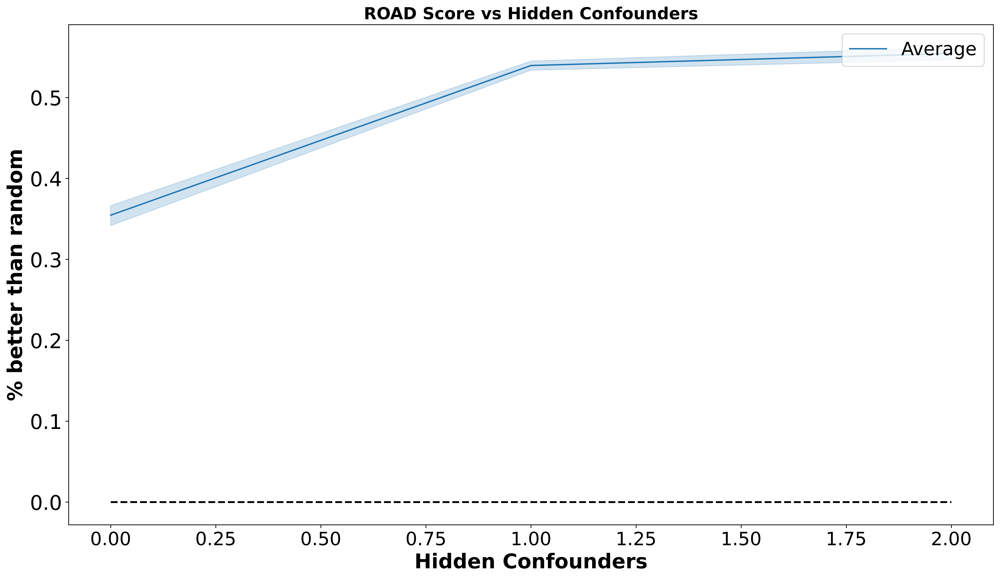

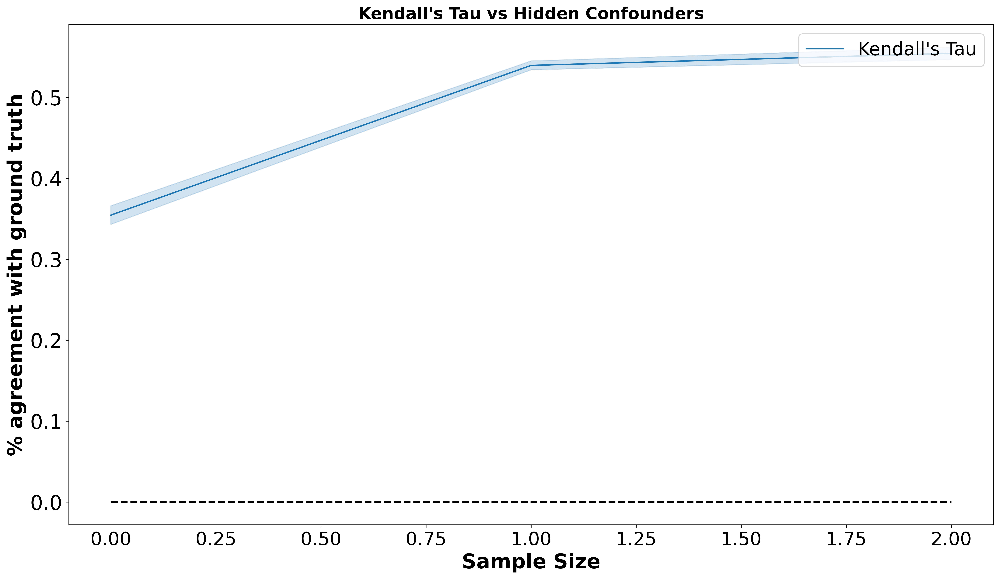

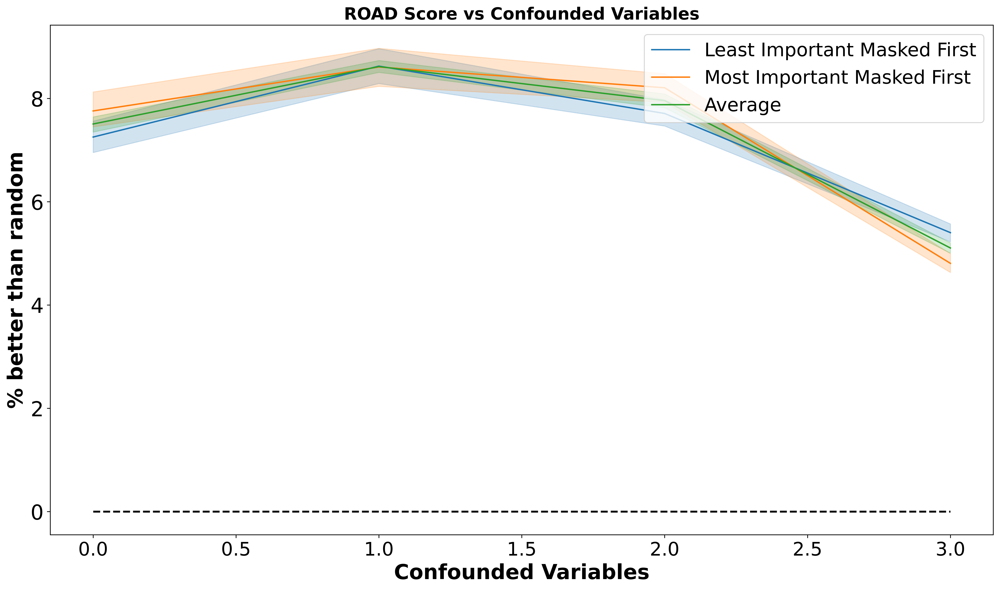

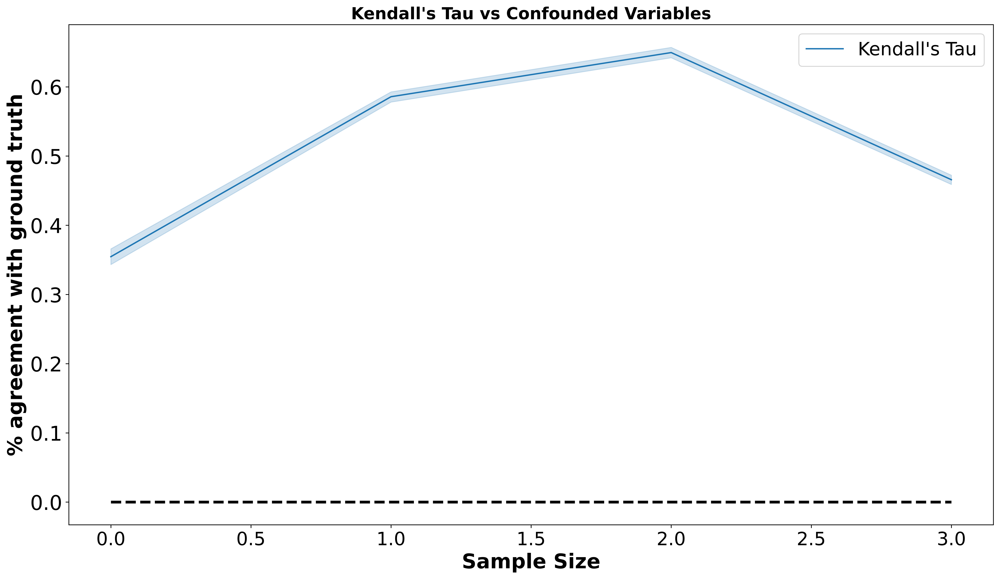

In [365]:
plt.figure(figsize=(18,10), dpi=600)
# sns.lineplot(x = 'Samples', y = 'score_bottom', data= df_hc.reset_index(), palette="colorblind", label = 'Least Important Masked First')
# sns.lineplot(x = 'Samples', y = 'score_top', data= df_hc.reset_index(), palette="colorblind", label = 'Most Important Masked First')
sns.lineplot(x = 'HC', y = 'kendall', data= df_hc.reset_index(), palette="colorblind", label = 'Average')
plt.hlines(0, 0, 2, linewidth = 2, color = 'black', ls = '--')
plt.title('ROAD Score vs Hidden Confounders',  fontdict = {'fontsize' : 18, 'fontweight': 'bold'})
plt.yticks(fontsize = 22)
plt.xticks(fontsize = 20) 
plt.ylabel('% better than random', fontsize = 22, fontweight = 'bold')
plt.xlabel('Hidden Confounders', fontsize = 22, fontweight = 'bold')
plt.legend(fontsize = 20, loc = 'upper right')
plt.show()

plt.figure(figsize=(18,10), dpi=600)
sns.lineplot(x = 'HC', y = 'kendall', data= df_hc.reset_index(), palette="colorblind", label = 'Kendall\'s Tau')
plt.hlines(0, 0, 2, linewidth = 2, color = 'black', ls = '--')
plt.title("Kendall's Tau vs Hidden Confounders",  fontdict = {'fontsize' : 18, 'fontweight': 'bold'})
plt.yticks(fontsize = 22)
plt.xticks(fontsize = 20) 
plt.ylabel('% agreement with ground truth', fontsize = 22, fontweight = 'bold')
plt.xlabel('Sample Size', fontsize = 22, fontweight = 'bold')
plt.legend(fontsize = 20, loc = 'upper right')
plt.show()

plt.figure(figsize=(18,10), dpi=600)
sns.lineplot(x = 'ConfVars', y = 'score_bottom', data= df_hc.reset_index(), palette="colorblind", label = 'Least Important Masked First')
sns.lineplot(x = 'ConfVars', y = 'score_top', data= df_hc.reset_index(), palette="colorblind", label = 'Most Important Masked First')
sns.lineplot(x = 'ConfVars', y = 'score', data= df_hc.reset_index(), palette="colorblind", label = 'Average')
plt.hlines(0, 0, 3, linewidth = 2, color = 'black', ls = '--')
plt.title('ROAD Score vs Confounded Variables',  fontdict = {'fontsize' : 18, 'fontweight': 'bold'})
plt.yticks(fontsize = 22)
plt.xticks(fontsize = 20) 
plt.ylabel('% better than random', fontsize = 22, fontweight = 'bold')
plt.xlabel('Confounded Variables', fontsize = 22, fontweight = 'bold')
plt.legend(fontsize = 20, loc = 'upper right')
plt.show()

plt.figure(figsize=(18,10), dpi=600)
sns.lineplot(x = 'ConfVars', y = 'kendall', data= df_hc.reset_index(), palette="colorblind", label = 'Kendall\'s Tau')
plt.hlines(0, 0, 3, linewidth = 3, color = 'black', ls = '--')
plt.title("Kendall's Tau vs Confounded Variables",  fontdict = {'fontsize' : 18, 'fontweight': 'bold'})
plt.yticks(fontsize = 22)
plt.xticks(fontsize = 20) 
plt.ylabel('% agreement with ground truth', fontsize = 22, fontweight = 'bold')
plt.xlabel('Sample Size', fontsize = 22, fontweight = 'bold')
plt.legend(fontsize = 20, loc = 'upper right')
plt.show()

### Study possible interactions that may be confounding the pearson correlation using an ANOVA

#### ROAD Score Interactions with HC and ConfVars

In [366]:
# ANOVA
model = ols('score ~ HC + ConfVars + C(Model) + C(Explainer) + Samples + Skew', data=df_hc).fit()
print('Type 2 ANOVA Test: formula = score ~ HC + ConfVars + C(Model) + C(Explainer)')
print(sm.stats.anova_lm(model, typ=2))
print('\n')
# print(sm.stats.multicomp.pairwise_tukeyhsd(files_of_int.score, files_of_int['HC'].astype(str) + ':' + files_of_int['ConfVars'].astype(str)))
print('\n')
model = ols('score ~  HC*ConfVars*C(Model)*C(Explainer)*Samples', data=df_hc).fit()
results = sm.stats.anova_lm(model, typ=3)




Type 2 ANOVA Test: formula = score ~ HC + ConfVars + C(Model) + C(Explainer)
                    sum_sq      df            F         PR(>F)
C(Model)        367.089014     3.0    12.263362   5.268620e-08
C(Explainer)    924.567754     6.0    15.443541   1.038236e-17
HC             5444.657989     1.0   545.669912  1.922209e-117
ConfVars      16091.839371     1.0  1612.742726   0.000000e+00
Samples        5213.580007     1.0   522.511010  1.142278e-112
Skew          55197.885072     1.0  5531.995791   0.000000e+00
Residual      96257.122639  9647.0          NaN            NaN






/Users/eddie/miniconda3/envs/python_env/lib/python3.8/site-packages/statsmodels/base/model.py:1871: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 18, but rank is 15
  warnings.warn('covariance of constraints does not have full '
/Users/eddie/miniconda3/envs/python_env/lib/python3.8/site-packages/statsmodels/base/model.py:1871: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 18, but rank is 15
  warnings.warn('covariance of constraints does not have full '
/Users/eddie/miniconda3/envs/python_env/lib/python3.8/site-packages/statsmodels/base/model.py:1871: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 18, but rank is 15
  warnings.warn('covariance of constraints does not have full '
/Users/eddie/miniconda3/envs/python_env/lib/python3.8/site-packages/statsmodels/base/model.py:1871: ValueWarning: covariance of constraints does not have full rank. The 

In [37]:
print(results.loc[results['PR(>F)'] < 0.05])

                                       sum_sq    df           F        PR(>F)
Intercept                         1811.316592   1.0  251.023233  8.063335e-56
HC                                 572.420205   1.0   79.329462  6.226481e-19
HC:C(Explainer)                    369.038817   6.0    8.523939  2.938883e-09
HC:C(Model):C(Explainer)           383.005760  18.0    2.948848  1.037955e-04
ConfVars                           370.004054   1.0   51.277405  8.616263e-13
ConfVars:C(Model)                  169.987173   3.0    7.852618  3.131183e-05
HC:ConfVars                        227.546343   1.0   31.534751  2.014288e-08
HC:ConfVars:C(Model)                73.955439   3.0    3.416398  1.660047e-02
HC:ConfVars:C(Explainer)           154.153188   6.0    3.560581  1.590951e-03
Samples                            230.198652   1.0   31.902325  1.668017e-08
HC:Samples                         270.467911   1.0   37.483083  9.586901e-10
HC:C(Explainer):Samples            263.905746   6.0    6.095610 

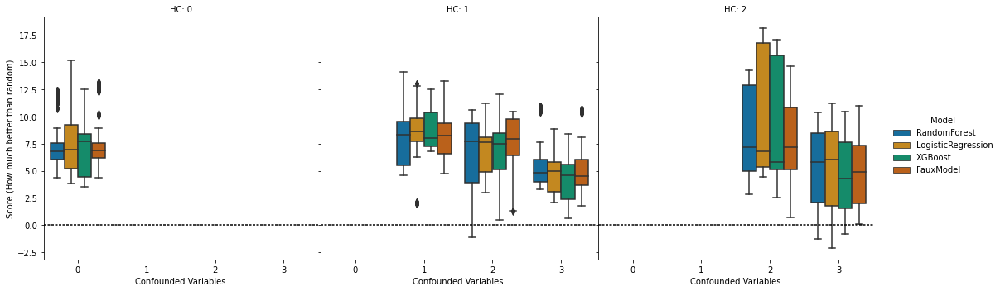

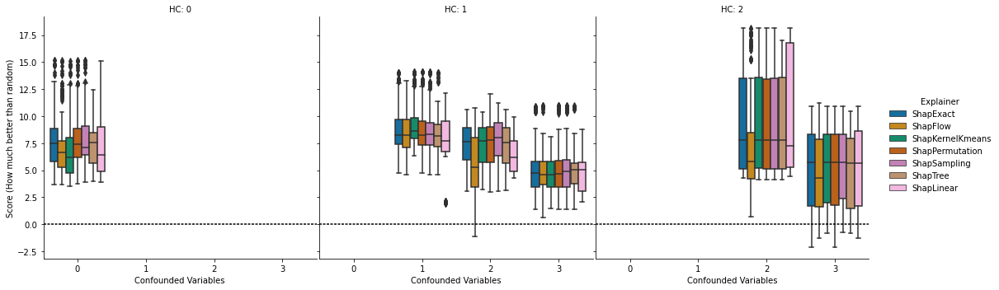

In [370]:
g = sns.catplot(x = 'ConfVars', y = 'score', hue='Model', col = 'HC', data= df, palette="colorblind", kind = 'box')

(g.map(plt.axhline, y=0, color ='black', dashes = (2,1))
  .set_axis_labels("Confounded Variables", "Score (How much better than random)")
  .set_titles("HC: {col_name}")
  .tight_layout(w_pad=0)
)

g = sns.catplot(x = 'ConfVars', y = 'score', hue='Explainer', col = 'HC', data= df, palette="colorblind", kind = 'box')

(g.map(plt.axhline, y=0, color ='black', dashes = (2,1))
  .set_axis_labels("Confounded Variables", "Score (How much better than random)")
  .set_titles("HC: {col_name}")
  .tight_layout(w_pad=0)
)

#### Kendall's Tau Interactions with HC and ConfVars

In [ ]:
# ANOVA
model = ols('kendall ~ HC + ConfVars + C(Model) + C(Explainer)', data=df).fit()
print('Type 2 ANOVA Test: formula = kendall ~ HC + ConfVars + C(Model) + C(Explainer)')
print(sm.stats.anova_lm(model, typ=2))
print('\n')
# print(sm.stats.multicomp.pairwise_tukeyhsd(files_of_int.score, files_of_int['HC'].astype(str) + ':' + files_of_int['ConfVars'].astype(str)))
print('\n')
model = ols('kendall ~  HC*ConfVars*C(Model)*C(Explainer)*Samples*Skew', data=df).fit()
print('Type 2 ANOVA Test: formula = kendall ~  HC*ConfVars*C(Model)*C(Explainer)')
print(sm.stats.anova_lm(model, typ=3))

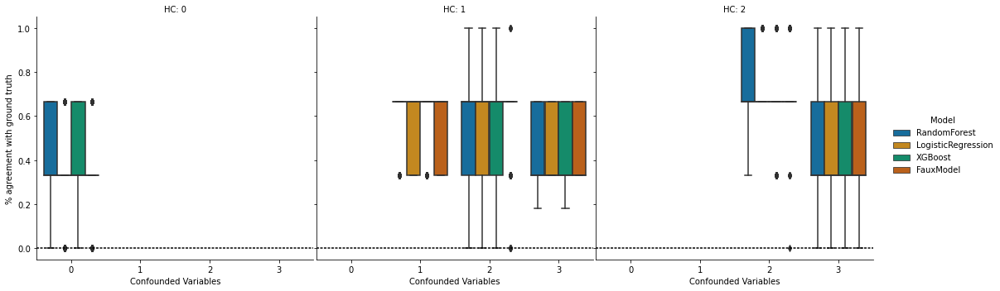

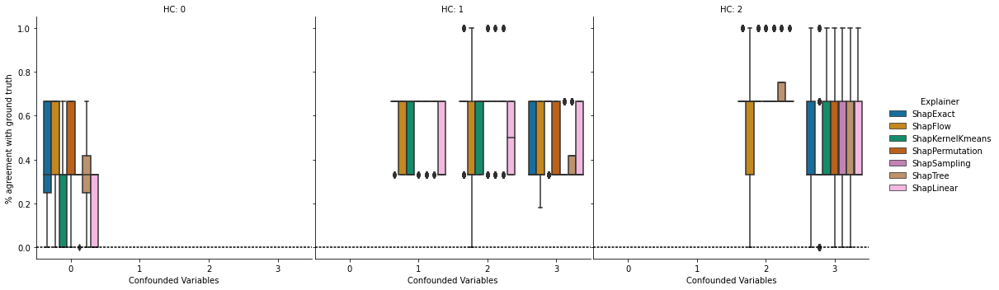

In [371]:
g = sns.catplot(x = 'ConfVars', y = 'kendall', hue='Model', col = 'HC', data= df, palette="colorblind", kind = 'box')

(g.map(plt.axhline, y=0, color ='black', dashes = (2,1))
  .set_axis_labels("Confounded Variables", "% agreement with ground truth")
  .set_titles("HC: {col_name}")
  .tight_layout(w_pad=0)
)

g = sns.catplot(x = 'ConfVars', y = 'kendall', hue='Explainer', col = 'HC', data= df, palette="colorblind", kind = 'box')

(g.map(plt.axhline, y=0, color ='black', dashes = (2,1))
  .set_axis_labels("Confounded Variables", "% agreement with ground truth")
  .set_titles("HC: {col_name}")
  .tight_layout(w_pad=0)
)

## Does the patter of confounding in the data affect explainer performance?

### Select only datasets where we varied the patterns confounding

In [373]:
df.columns

Index(['Dataset', 'Explainer', 'Repeat', 'Model', 'score', 'score_bottom',
       'score_top', 'kendall', 'random', 'noise', 'Skew', 'Samples', 'HC',
       'ConfVars', 'AB'],
      dtype='object')

In [382]:
df_ab = df.loc[(df.ConfVars.values == 3) & (df.HC.values == 2)].dropna()
df_ab.columns = ['Dataset', 'Model', 'Repeat', 'Explainer', 'Average Score', 'Least Important First', 'Most Important First', 'Kendalls Tau', 'random', 'noise', 'Skew', 'Samples', 'HC', 'ConfVars', 'AB']
df_ab

,Dataset,Model,Repeat,Explainer,Average Score,Least Important First,Most Important First,Kendalls Tau,random,noise,Skew,Samples,HC,ConfVars,AB
7820,3_vars_corr_2HC_n100.csv,ShapExact,0,RandomForest,9.440559,-1.491841,20.372960,0.666667,0.870536,0.026924,0.5,100,2,3,Fully Confounded
7821,3_vars_corr_2HC_n100.csv,ShapExact,1,RandomForest,9.835567,3.028869,16.642265,0.666667,0.831575,0.026924,0.5,100,2,3,Fully Confounded
7822,3_vars_corr_2HC_n100.csv,ShapExact,2,RandomForest,10.054565,7.430194,12.678937,0.666667,0.793831,0.026924,0.5,100,2,3,Fully Confounded
7823,3_vars_corr_2HC_n100.csv,ShapExact,3,RandomForest,9.734874,1.703739,17.766009,0.666667,0.842938,0.026924,0.5,100,2,3,Fully Confounded
7824,3_vars_corr_2HC_n100.csv,ShapExact,4,RandomForest,10.090345,9.417889,10.762800,0.666667,0.776786,0.026924,0.5,100,2,3,Fully Confounded
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10575,3_vars_corr_2HC_n900B.csv,ShapSampling,5,FauxModel,8.178020,0.000000,16.356040,0.333333,0.892257,0.000000,0.5,900,2,3,Partially Confounded
10576,3_vars_corr_2HC_n900B.csv,ShapSampling,6,FauxModel,8.523044,10.430278,6.615809,0.333333,0.799192,0.000000,0.5,900,2,3,Partially Confounded
10577,3_vars_corr_2HC_n900B.csv,ShapSampling,7,FauxModel,8.178020,0.000000,16.356040,0.333333,0.892257,0.000000,0.5,900,2,3,Partially Confounded
10578,3_vars_corr_2HC_n900B.csv,ShapSampling,8,FauxModel,8.335679,14.496187,2.175170,0.333333,0.762913,0.000000,0.5,900,2,3,Partially Confounded


### Spearman Correlations between: (1) Confounding Pattern and road score, (2) Confounding Pattern and kendall's tau

In [383]:
#Pearson Correlation
ab_vs_road = scipy.stats.spearmanr(df_ab.AB, df_ab['Average Score'])
ab_vs_data = scipy.stats.spearmanr(df_ab.AB, df_ab['Kendalls Tau'])


#Report the results
print(f'ROAD vs AB: CorrCoeff = {ab_vs_road[0]}, p-value = {ab_vs_road[1]}')
print(f'Kendall vs AB: CorrCoeff = {ab_vs_data[0]}, p-value = {ab_vs_data[1]}')

ROAD vs AB: CorrCoeff = 0.7148284158211257, p-value = 0.0
Kendall vs AB: CorrCoeff = -0.6849007056442753, p-value = 0.0


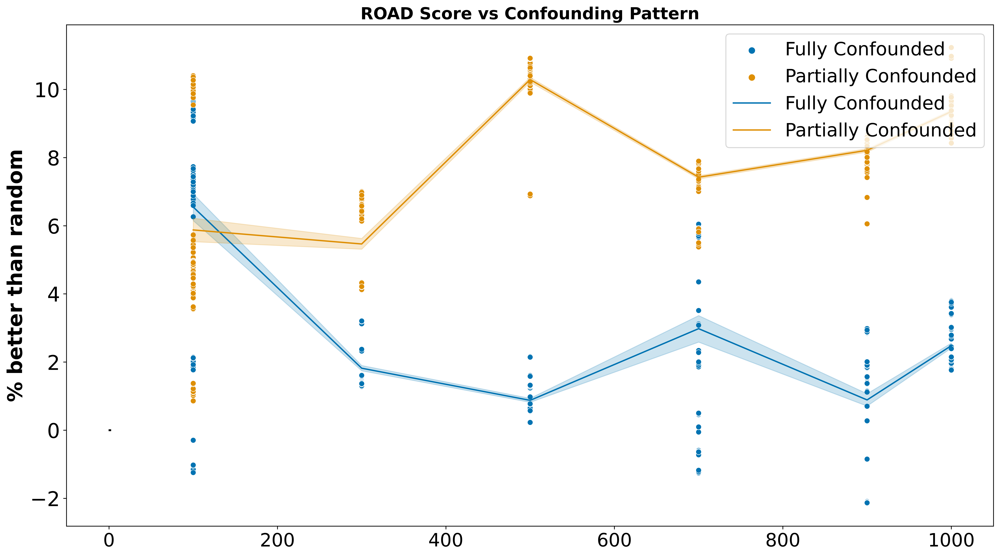

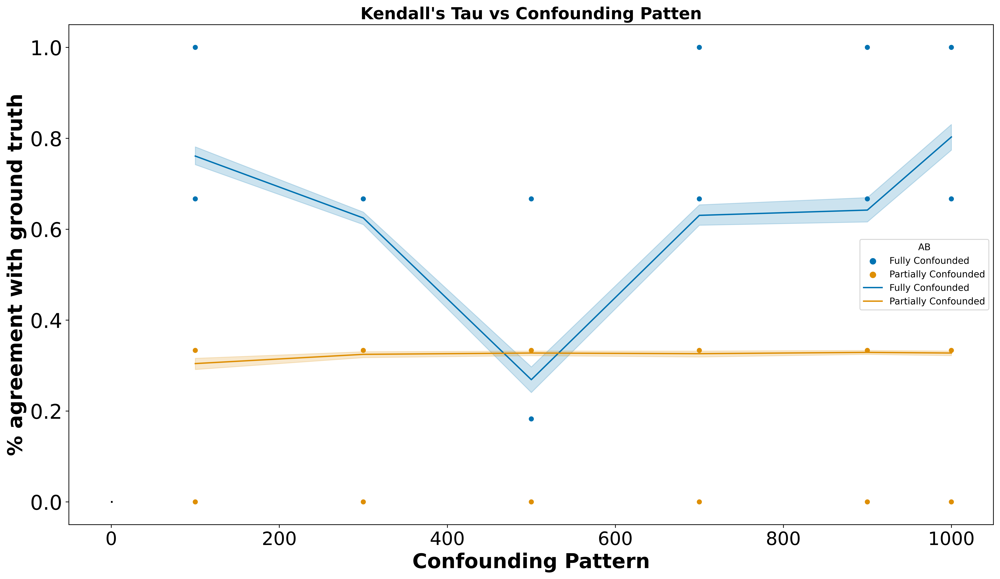

In [386]:
# pivot the score_top, scorE_bottom, and score into one column
# df_ab_pivot = df_ab.loc[:, ('Dataset', 'Model', 'Explainer', 'AB', 'Average Score', 'Least Important First', 'Most Important First')].melt(['Dataset', 'Model', 'Explainer', 'AB'])
plt.figure(figsize=(18,10), dpi=600)
sns.scatterplot(x = 'Samples', y = 'Average Score', hue = 'AB', data= df_ab, palette="colorblind")
sns.lineplot(x = 'Samples', y = 'Average Score', hue = 'AB', data= df_ab, palette="colorblind")
plt.hlines(0, -0.5, 2.5, linewidth = 2, color = 'black', ls = '--')
plt.title('ROAD Score vs Confounding Pattern',  fontdict = {'fontsize' : 18, 'fontweight': 'bold'})
plt.yticks(fontsize = 22)
plt.xticks(fontsize = 20) 
plt.ylabel('% better than random', fontsize = 22, fontweight = 'bold')
plt.xlabel('', fontsize = 22, fontweight = 'bold')
plt.legend(fontsize = 20, loc = 'upper right')
plt.show()

plt.figure(figsize=(18,10), dpi=600)
sns.scatterplot(x = 'Samples', y = 'Kendalls Tau', hue = 'AB', data= df_ab, palette="colorblind")
sns.lineplot(x = 'Samples', y = 'Kendalls Tau', hue = 'AB', data= df_ab, palette="colorblind")
plt.hlines(0, -0.5, 1.5, linewidth = 2, color = 'black', ls = '--')
plt.title("Kendall's Tau vs Confounding Patten",  fontdict = {'fontsize' : 18, 'fontweight': 'bold'})
plt.yticks(fontsize = 22)
plt.xticks(fontsize = 20) 
plt.ylabel('% agreement with ground truth', fontsize = 22, fontweight = 'bold')
plt.xlabel('Confounding Pattern', fontsize = 22, fontweight = 'bold')
plt.show()

### Study possible interactions that may be confounding the correlation using an ANOVA

In [45]:
df_ab = df.loc[(df.ConfVars.values == 3) & (df.HC.values == 2)].dropna().reset_index()
# ANOVA
model = ols('score ~ C(AB) + C(Model) + C(Explainer)', data=df_ab).fit()
print('Type 2 ANOVA Test: formula = score ~ C(AB) + C(Model) + C(Explainer)')
print(sm.stats.anova_lm(model, typ=2))
print('\n')
# print(sm.stats.multicomp.pairwise_tukeyhsd(files_of_int.score, files_of_int['HC'].astype(str) + ':' + files_of_int['ConfVars'].astype(str)))
print('\n')
model = ols('score ~ C(Model):C(AB) + C(Model):C(Explainer) + C(AB):C(Explainer)', data=df_ab).fit()
print('Type 2 ANOVA Test: formula = score ~ C(Model):C(AB) + C(Model):C(Explainer) + C(AB):C(Explainer)')
print(sm.stats.anova_lm(model, typ=3))

Type 2 ANOVA Test: formula = score ~ C(AB) + C(Model) + C(Explainer)
                    sum_sq      df            F        PR(>F)
C(AB)         19138.717223     1.0  3320.580161  0.000000e+00
C(Model)        220.996189     3.0    12.780995  2.711800e-08
C(Explainer)    123.636267     6.0     3.575162  1.565209e-03
Residual      15844.319698  2749.0          NaN           NaN




Type 2 ANOVA Test: formula = score ~ C(Model):C(AB) + C(Model):C(Explainer) + C(AB):C(Explainer)
                             sum_sq      df          F         PR(>F)
Intercept                347.761253     1.0  61.843137   5.312659e-15
C(Model):C(AB)          3922.674979     7.0  99.653970  5.152559e-130
C(Model):C(Explainer)    324.825946    24.0   2.406854   5.846001e-04
C(AB):C(Explainer)        45.996930     6.0   1.363289   2.256675e-01
Residual               15334.683522  2727.0        NaN            NaN


/Users/eddie/miniconda3/envs/python_env/lib/python3.8/site-packages/statsmodels/base/model.py:1871: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 24, but rank is 19
  warnings.warn('covariance of constraints does not have full '


In [387]:
g = sns.relplot(x = 'Explainer', y = 'score', hue='AB', col = 'Model', col_wrap= 5, data= df_ab.reset_index(), palette="colorblind", kind = 'scatter')

(g.map(plt.axhline, y=0, color ='black', dashes = (2,1))
  .set_axis_labels("Explainer", "Score (How much better than random)")
  .set_titles("Model: {col_name}")
  .tight_layout(w_pad=0)
)

ValueError: Could not interpret value `score` for parameter `y`

#### ANOVA of Kendall's Tau Interactions

In [47]:
# ANOVA
model = ols('kendall ~ C(AB) + C(Model) + C(Explainer)', data=df_ab).fit()
print('Type 2 ANOVA Test: ROAR Score explained by Class Imbalance, Model, and Explainer')
print(sm.stats.anova_lm(model, typ=2))
print('\n')
# print(sm.stats.multicomp.pairwise_tukeyhsd(files_of_int.score, files_of_int['HC'].astype(str) + ':' + files_of_int['ConfVars'].astype(str)))
print('\n')
model = ols('kendall ~ C(Model):C(AB) + C(Model):C(Explainer) + C(AB):C(Explainer)', data=df_ab).fit()
print('Type 3 ANOVA Test: ROAR Score explained by interactions across Class Imbalance, Model, and Explainer')
print(sm.stats.anova_lm(model, typ=2))

Type 2 ANOVA Test: ROAR Score explained by Class Imbalance, Model, and Explainer
                 sum_sq      df            F        PR(>F)
C(AB)         66.371014     1.0  2335.936059  0.000000e+00
C(Model)       0.524815     3.0     6.156974  3.615642e-04
C(Explainer)   5.489815     6.0    32.202452  1.182199e-37
Residual      78.107411  2749.0          NaN           NaN




Type 3 ANOVA Test: ROAR Score explained by interactions across Class Imbalance, Model, and Explainer
                          sum_sq      df          F        PR(>F)
C(Model):C(AB)         11.380864     7.0  59.887217  2.859544e-80
C(Model):C(Explainer)  10.078596    24.0  15.468413  2.487684e-48
C(AB):C(Explainer)      1.609074     6.0   9.878289  8.350877e-11
Residual               74.033488  2727.0        NaN           NaN


/Users/eddie/miniconda3/envs/python_env/lib/python3.8/site-packages/statsmodels/base/model.py:1871: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 24, but rank is 19
  warnings.warn('covariance of constraints does not have full '


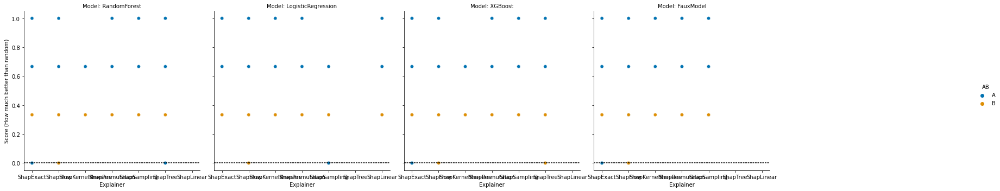

In [48]:
g = sns.relplot(x = 'Explainer', y = 'kendall', hue='AB', col = 'Model', col_wrap= 5, data= df_ab.reset_index(), palette="colorblind", kind = 'scatter', alpha= 0.7)

(g.map(plt.axhline, y=0, color ='black', dashes = (2,1))
  .set_axis_labels("Explainer", "Score (How much better than random)")
  .set_titles("Model: {col_name}")
  .tight_layout(w_pad=0)
)

## How do data explainability and model explainability interact?

In [596]:
df = pd.read_csv('/Users/eddie/Library/CloudStorage/OneDrive-UniversityofPittsburgh/Research/Projects/Explainability Method Comparison/Data-ML-XAI-Eval/Results/XAI Evaluation Data/CleanEvals.csv')
df = df.loc[df.Samples.isin([100, 300, 500, 700, 900, 1000])]
df['Combination'] = np.abs(df.kendall-df.score)
df.score = df.score*100
df.score_bottom = df.score_bottom*100
df.score_top = df.score_top*100
df.AB = df.AB.str.replace('A', 'Fully Confounded').replace('B', 'Partially Confounded')


### Pearson Correlations between: ROAD Score and Kendall's Tau

In [597]:
#Pearson Correlation between score and kendall
score_vs_kendall = scipy.stats.spearmanr(df.kendall, df.score)
print(f'Pearson Correlation: ROAD Score vs Kendall Tau: CorrCoeff = {score_vs_kendall[0]}, p-value = {score_vs_kendall[1]}')

Pearson Correlation: ROAD Score vs Kendall Tau: CorrCoeff = -0.09150058078450615, p-value = 0.004424748552137956


In [598]:
#Pearson Correlation between score and kendall when the model is FauxModel
score_vs_kendall = scipy.stats.spearmanr(df.loc[df.Model == 'FauxModel'].kendall, df.loc[df.Model == 'FauxModel'].score)
print(f'Pearson Correlation: ROAD Score vs Kendall Tau: CorrCoeff = {score_vs_kendall[0]}, p-value = {score_vs_kendall[1]}')

#Pearson Correlation between score and kendall when the model is not FauxModel
score_vs_kendall = scipy.stats.spearmanr(df.loc[df.Model != 'FauxModel'].kendall, df.loc[df.Model != 'FauxModel'].score)
print(f'Pearson Correlation: ROAD Score vs Kendall Tau: CorrCoeff = {score_vs_kendall[0]}, p-value = {score_vs_kendall[1]}')

Pearson Correlation: ROAD Score vs Kendall Tau: CorrCoeff = -0.03266481580371291, p-value = 0.6378846763532596
Pearson Correlation: ROAD Score vs Kendall Tau: CorrCoeff = -0.11118810390546777, p-value = 0.002201525663181378


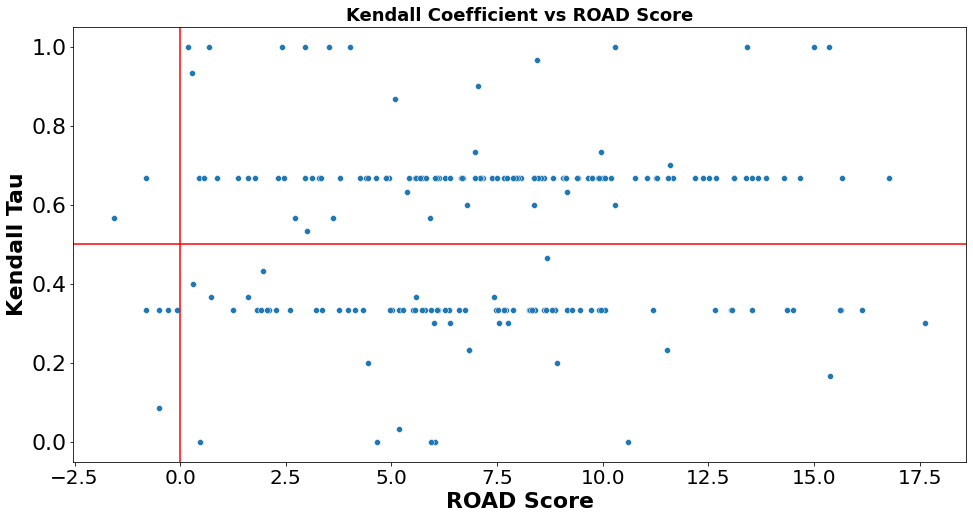

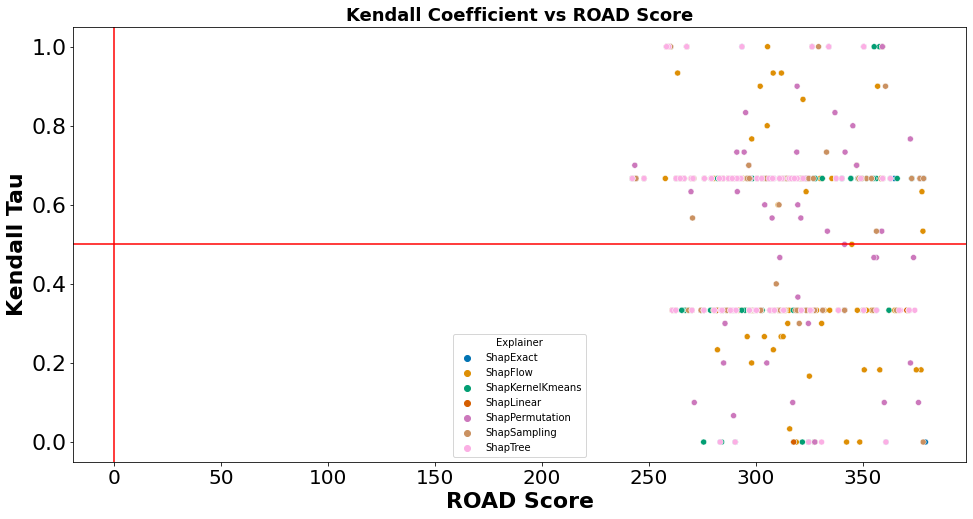

In [604]:
plt.figure(figsize=(16,8))
# df['HC'] = df.HC > 0
sns.scatterplot(x = 'score_top', y = 'kendall', data= df.loc[df.Model == 'FauxModel'], palette="colorblind")
plt.title('Kendall Coefficient vs ROAD Score',  fontdict = {'fontsize' : 18, 'fontweight': 'bold'})
plt.yticks(fontsize = 22)
plt.xticks(fontsize = 20) 
plt.xlabel('ROAD Score', fontsize = 22, fontweight = 'bold')
plt.ylabel('Kendall Tau', fontsize = 22, fontweight = 'bold')
plt.axvline(0, c = 'r')
plt.axhline(0.5, c = 'r')
plt.show()

plt.figure(figsize=(16,8))
# df['HC'] = df.HC > 0
sns.scatterplot(x = 'score', y = 'kendall', data= df.loc[df.Model != 'FauxModel'], palette="colorblind", hue='Explainer')
plt.title('Kendall Coefficient vs ROAD Score',  fontdict = {'fontsize' : 18, 'fontweight': 'bold'})
plt.yticks(fontsize = 22) 
plt.xticks(fontsize = 20) 
plt.xlabel('ROAD Score', fontsize = 22, fontweight = 'bold')
plt.ylabel('Kendall Tau', fontsize = 22, fontweight = 'bold')
plt.axvline(0, c = 'r')
plt.axhline(0.5, c = 'r')
plt.show()

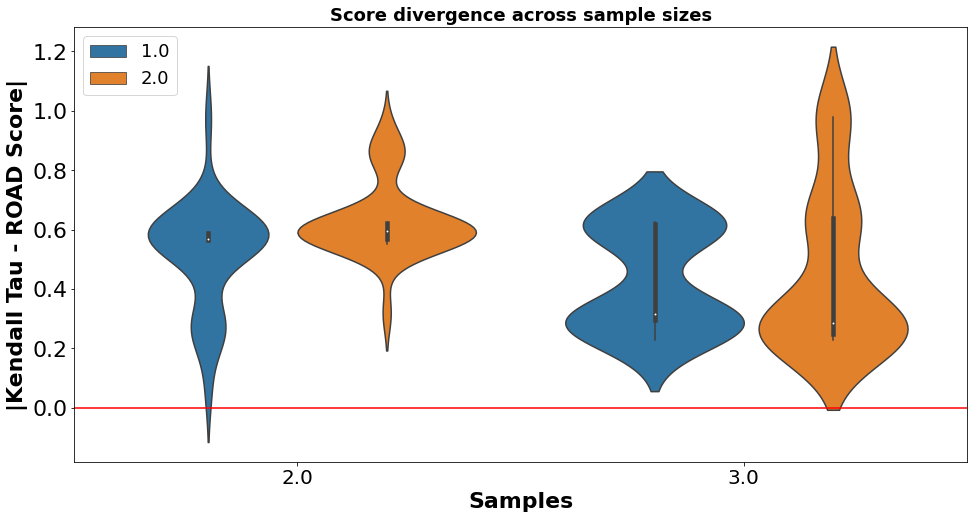

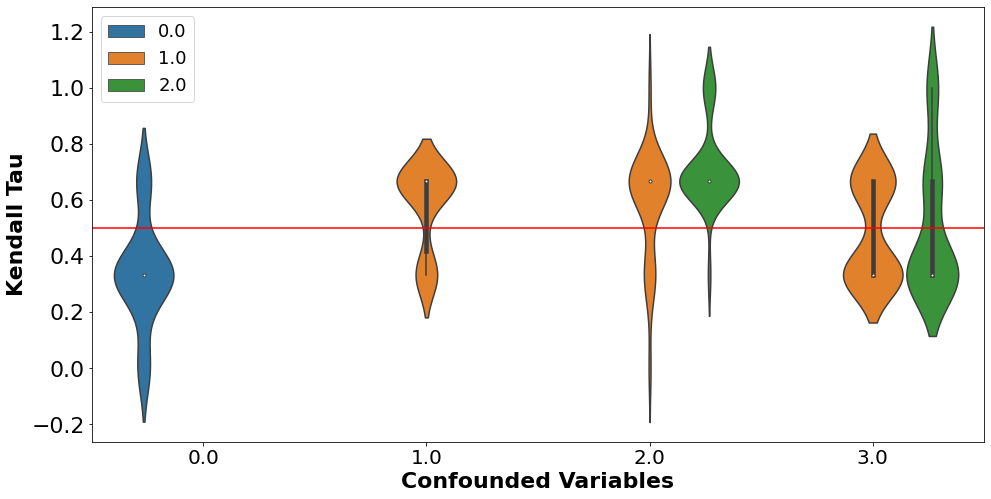

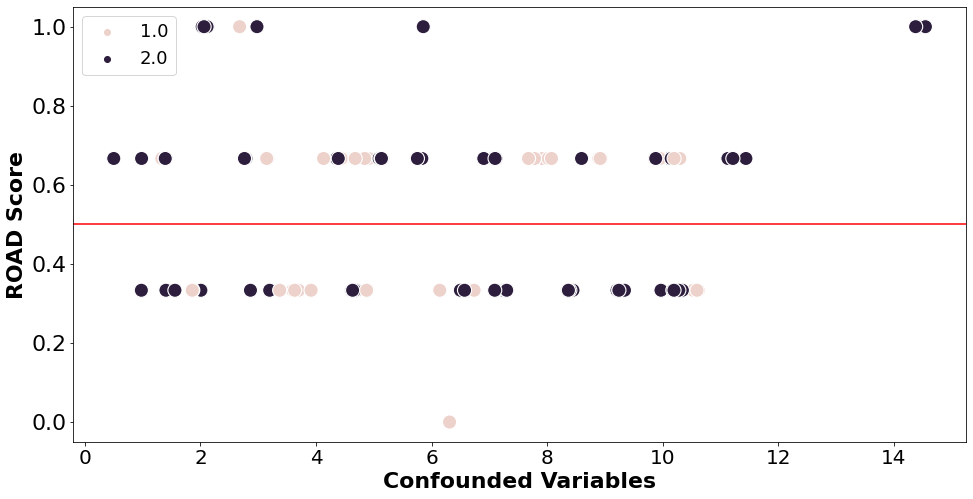

In [508]:
plt.figure(figsize=(16,8))
sns.violinplot(x = 'ConfVars', y = 'Combination', hue = 'HC', data= df.loc[np.logical_and(df.Model == 'FauxModel', df.ConfVars > 1)], s=200)
# sns.lineplot(x = 'score', y = 'kendall', data= df.loc[df.Model == 'FauxModel'])
plt.title('Score divergence across sample sizes',  fontdict = {'fontsize' : 18, 'fontweight': 'bold'})
plt.yticks(fontsize = 22)
plt.xticks(fontsize = 20) 
plt.xlabel('Samples', fontsize = 22, fontweight = 'bold')
plt.ylabel('|Kendall Tau - ROAD Score|', fontsize = 22, fontweight = 'bold')
plt.axhline(0, c = 'r')
plt.legend(loc = 'upper left', fontsize = 18)
plt.show()

plt.figure(figsize=(16,8))
sns.violinplot(x = 'ConfVars', y = 'kendall', data= df.loc[df.Model == 'FauxModel'], s=200, hue = 'HC')
# sns.lineplot(x = 'score', y = 'kendall', data= df.loc[df.Model == 'FauxModel'])
# plt.title('Kendall Tau vs Sample Size',  fontdict = {'fontsize' : 18, 'fontweight': 'bold'})
plt.yticks(fontsize = 22)
plt.xticks(fontsize = 20) 
plt.xlabel('Confounded Variables', fontsize = 22, fontweight = 'bold')
plt.ylabel('Kendall Tau', fontsize = 22, fontweight = 'bold')
plt.axhline(0.5, c = 'r')
plt.legend(loc = 'upper left', fontsize = 18)
plt.show()

plt.figure(figsize=(16,8))
sns.scatterplot(x = 'score', y = 'kendall', data= df.loc[np.logical_and(df.Model == 'FauxModel', df.ConfVars > 1)], s=200, hue = 'HC')
# plt.title('Kendall Tau vs Sample Size',  fontdict = {'fontsize' : 18, 'fontweight': 'bold'})
plt.yticks(fontsize = 22)
plt.xticks(fontsize = 20) 
plt.xlabel('Confounded Variables', fontsize = 22, fontweight = 'bold')
plt.ylabel('ROAD Score', fontsize = 22, fontweight = 'bold')
plt.axhline(0.5, c = 'r')
plt.legend(loc = 'upper left', fontsize = 18)
plt.show()



### Study possible interactions that may be confounding the correlation using an ANCOVA

#### ROAD Score & Kendall Tau interactions

In [87]:
df.random 

Index(['Dataset', 'Explainer', 'Repeat', 'Model', 'score', 'score_bottom',
       'score_top', 'kendall', 'random', 'Skew', 'Samples', 'HC', 'ConfVars',
       'AB'],
      dtype='object')

In [526]:
model = ols('score ~ HC * ConfVars * C(Explainer) * Samples', data=df.loc[np.logical_and(df.Model == 'FauxModel', df.AB == 'Fully Confounded')]).fit()
print('Type 2 ANOVA Test: ROAR Score explained by Class Imbalance, Model, and Explainer')
anova = sm.stats.anova_lm(model, typ=3)

Type 2 ANOVA Test: ROAR Score explained by Class Imbalance, Model, and Explainer


In [527]:
anova.loc[anova['PR(>F)'] <= 0.05]

,sum_sq,df,F,PR(>F)
Intercept,171.457743,1.0,28.494792,3.698270e-07
HC,64.648669,1.0,10.744049,1.319494e-03
ConfVars,27.246325,1.0,4.528103,3.509448e-02
HC:ConfVars,28.829656,1.0,4.791239,3.026231e-02
ConfVars:Samples,33.916001,1.0,5.636546,1.894701e-02


In [528]:
model = ols('score:kendall ~ HC * ConfVars * C(Explainer) * Samples', data=df.loc[df.Model == 'FauxModel']).fit()
anova = sm.stats.anova_lm(model, typ=3)

In [529]:
anova.loc[anova['PR(>F)'] <= 0.005]

,sum_sq,df,F,PR(>F)
HC,111.152648,1.0,29.434686,1.963864e-07
HC:ConfVars,52.823024,1.0,13.988233,2.511881e-04
HC:Samples,37.478955,1.0,9.924921,1.926991e-03


In [216]:
model = ols('kendall ~ HC * ConfVars * C(Model) * C(Explainer) * Samples', data=df).fit()
print('Type 2 ANOVA Test: ROAR Score explained by Class Imbalance, Model, and Explainer')
anova = sm.stats.anova_lm(model, typ=3)

Type 2 ANOVA Test: ROAR Score explained by Class Imbalance, Model, and Explainer


/Users/eddie/miniconda3/envs/python_env/lib/python3.8/site-packages/statsmodels/base/model.py:1871: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 18, but rank is 15
  warnings.warn('covariance of constraints does not have full '
/Users/eddie/miniconda3/envs/python_env/lib/python3.8/site-packages/statsmodels/base/model.py:1871: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 18, but rank is 15
  warnings.warn('covariance of constraints does not have full '
/Users/eddie/miniconda3/envs/python_env/lib/python3.8/site-packages/statsmodels/base/model.py:1871: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 18, but rank is 15
  warnings.warn('covariance of constraints does not have full '
/Users/eddie/miniconda3/envs/python_env/lib/python3.8/site-packages/statsmodels/base/model.py:1871: ValueWarning: covariance of constraints does not have full rank. The 

In [77]:
anova.loc[anova['PR(>F)'] <= 0.005]

,sum_sq,df,F,PR(>F)
C(Explainer),0.677957,6.0,3.531228,1.711221e-03
C(Model):C(Explainer),3.920779,18.0,6.807298,6.392585e-15
HC,3.718027,1.0,116.195011,6.170734e-27
HC:C(Model),0.889637,3.0,9.267580,4.071779e-06
HC:C(Explainer),1.092649,6.0,5.691204,6.454750e-06
HC:C(Model):C(Explainer),5.241520,18.0,9.100382,1.674487e-21
ConfVars:C(Model):C(Explainer),3.528289,18.0,6.125853,5.185606e-13
HC:ConfVars,1.606649,1.0,50.210657,1.479459e-12
HC:ConfVars:C(Model),0.678847,3.0,7.071726,9.601257e-05
HC:ConfVars:C(Explainer),0.648115,6.0,3.375793,2.512344e-03


## Assess monotonicity

In [509]:
noise_vs_road = scipy.stats.pearsonr(df.noise, df.score)
noise_vs_data = scipy.stats.pearsonr(df.noise, df.kendall)

#report the resutls
print(f'ROAD vs Noise: CorrCoeff = {noise_vs_road[0]}, p-value = {noise_vs_road[1]}')
print(f'Kendall vs Noise: CorrCoeff = {noise_vs_data[0]}, p-value = {noise_vs_data[1]}')

ROAD vs Noise: CorrCoeff = 0.08216237462677183, p-value = 0.010999790877650004
Kendall vs Noise: CorrCoeff = 0.02371728061037067, p-value = 0.4636510649523469


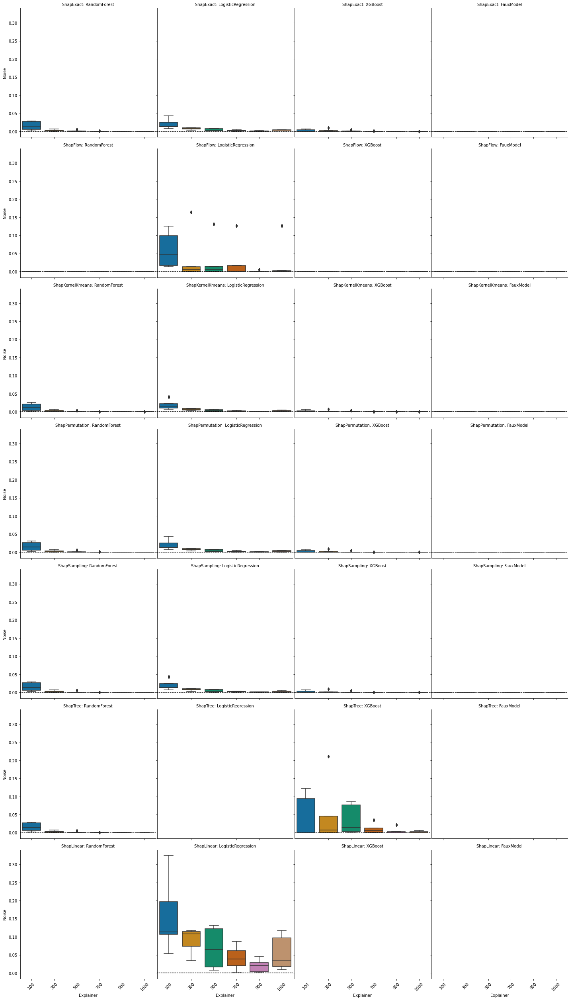

In [411]:
g = sns.catplot(x = 'Samples', y = 'noise', row='Explainer', col = 'Model', data= df, palette="colorblind", kind = 'box').set_xticklabels(rotation=45)

g.map(plt.axhline, y=0, color ='black', dashes = (2,1)).set_axis_labels("Explainer", "Noise").set_titles("{row_name}: {col_name}").tight_layout(w_pad=0)



In [419]:
df.groupby('Explainer').noise.mean()

Explainer
ShapExact           0.002365
ShapFlow            0.006216
ShapKernelKmeans    0.002138
ShapLinear          0.070434
ShapPermutation     0.002406
ShapSampling        0.002381
ShapTree            0.011699
Name: noise, dtype: float64

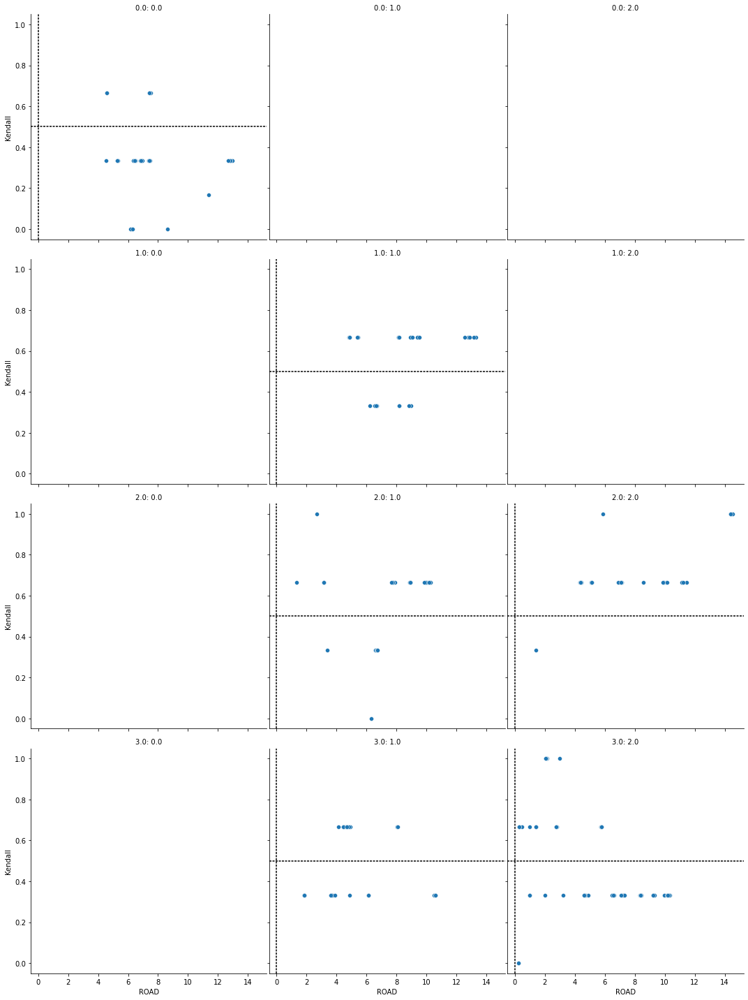

In [530]:
g = sns.relplot(x = 'score', y = 'kendall', col = 'HC', row='ConfVars', data= df.loc[df.Model == 'FauxModel'], palette="colorblind", kind = 'scatter')

(g.map(plt.axhline, y=0.5, color ='black', dashes = (2,1))
  .map(plt.axvline, x=0, color ='black', dashes = (2,1))
  .set_axis_labels("ROAD", "Kendall")
  .set_titles("{row_name}: {col_name}")
  .tight_layout(w_pad=0)
)

In [625]:
feats = np.array([1,4,2,3])
ranks = np.argsort([1,4,2,3])

j = 1
i = 0
k = j

while k <= len(feats):
    print(df[df.columns[ranks[i:k]]])
    print(ranks.copy()[i:k].tolist().pop())
    i+=j
    k+=j

      Explainer
0     ShapExact
1     ShapExact
3     ShapExact
5     ShapExact
7     ShapExact
...         ...
1053   ShapTree
1054   ShapTree
1055   ShapTree
1056   ShapTree
1057   ShapTree

[966 rows x 1 columns]
0
                        Dataset
0      0_vars_corr_0HC_n100.csv
1     0_vars_corr_0HC_n1000.csv
3      0_vars_corr_0HC_n300.csv
5      0_vars_corr_0HC_n500.csv
7      0_vars_corr_0HC_n700.csv
...                         ...
1053  3_vars_corr_2HC_n500B.csv
1054   3_vars_corr_2HC_n700.csv
1055  3_vars_corr_2HC_n700B.csv
1056   3_vars_corr_2HC_n900.csv
1057  3_vars_corr_2HC_n900B.csv

[966 rows x 1 columns]
2
                        AB
0         Fully Confounded
1         Fully Confounded
3         Fully Confounded
5         Fully Confounded
7         Fully Confounded
...                    ...
1053  Partially Confounded
1054      Fully Confounded
1055  Partially Confounded
1056      Fully Confounded
1057  Partially Confounded

[966 rows x 1 columns]
3
          Model
0     